# 🍵 茶道解説AIエージェント - Jupyter Notebook版

**Tea Ceremony Analysis AI Agent for Jupyter Notebooks**

ノートブック環境で使いやすいように最適化された茶道解説AIエージェント

## 機能
- 🔍 茶道具の画像分析と解説
- 🌸 季節性の分析
- 📊 茶道具データベース表示
- 📈 分析履歴管理
- 🎨 可視化機能

## 必要なライブラリ
```bash
pip install google-cloud-aiplatform pillow matplotlib pandas ipython
```

## 1. ライブラリのインポート

In [37]:
from google.genai.types import Part, UserContent, ModelContent
from google.adk.agents.llm_agent import LlmAgent
from google.adk.artifacts import InMemoryArtifactService
from google.adk.memory.in_memory_memory_service import InMemoryMemoryService
from google.adk.sessions import InMemorySessionService
from google.adk.runners import Runner
from google.adk.tools import google_search
import os
import copy, datetime, json, os, pprint, time, uuid
import vertexai


In [3]:
PROJECT_ID = input("Project ID を設定してください")
LOCATION = 'us-central1'

In [6]:
vertexai.init(project=PROJECT_ID, location=LOCATION,
              staging_bucket=f'gs://{PROJECT_ID}')

os.environ['GOOGLE_CLOUD_PROJECT'] = PROJECT_ID
os.environ['GOOGLE_CLOUD_LOCATION'] = LOCATION
os.environ['GOOGLE_GENAI_USE_VERTEXAI'] = 'True'

In [7]:
analysis_prompts = {
            "tool_identification": """
あなたは茶道の専門家です。画像に写っている茶道具を分析し、以下の情報を提供してください：

1. 道具の名称と種類
2. 材質や技法の特徴
3. 季節性や文様の意味
4. 歴史的背景や作家情報（推定可能な場合）
5. 茶道における使用方法や意義

日本語で丁寧に、初心者にも分かりやすく説明してください。
""",
            "setting_analysis": """
あなたは茶道の専門家です。茶室の設えを分析し、以下について解説してください：

1. 床の間の設え（掛物、花入、香合など）
2. 季節感の演出方法
3. 亭主のおもてなしの心
4. 取り合わせの美意識
5. 各要素の調和と意味

茶会の背景にある文化的意味も含めて、日本語で解説してください。
""",
            "seasonal_context": """
現在の季節を考慮して、画像の茶道具や設えの季節感について分析してください：

1. 季節に適した道具選び
2. 文様や色彩の季節性
3. 茶会の時期に込められた意味
4. 季節の移ろいの表現

日本語で季節感豊かに説明してください。
"""
}

In [47]:
seasonal_review_agent = LlmAgent(
    name='seasonal_review_agent',
    model='gemini-2.5-flash',
#    model='gemini-2.0-flash',
    description='季節感を解説するエージェント',
    instruction=analysis_prompts['seasonal_context'],
    # tools=[google_search]
)

In [48]:
tool_identify_agent = LlmAgent(
    name='tool_identify_agent',
    model='gemini-2.5-flash',
#    model='gemini-2.0-flash',
    description='道具を解説するエージェント',
    instruction=analysis_prompts['tool_identification'],
    # tools=[google_search]
)

In [49]:
setting_analysis_agent = LlmAgent(
    name='setting_analysis_agent',
    model='gemini-2.5-flash',
#    model='gemini-2.0-flash',
    description='茶室を解説するエージェント',
    instruction=analysis_prompts['setting_analysis'],
    # tools=[google_search]
)

In [50]:
planner_agent = LlmAgent(
    name='setting_analysis_agent',
    model='gemini-2.5-flash',
#    model='gemini-2.0-flash',
    description='回答を計画するエージェント',
    instruction='質問に応じてseasonal_review_agent、tool_identify_agent、setting_analysis_agentに振り分けて',
    sub_agents=[seasonal_review_agent, tool_identify_agent, setting_analysis_agent]
)

In [44]:
class LocalApp:
    def __init__(self, agent, app_name, user_id, runner, session):
        self._agent = agent
        self._app_name = app_name
        self._user_id = user_id
        self._runner = runner
        self._session = session
    
    @classmethod
    async def create(cls, agent, app_name, user_id):
        runner = Runner(
            app_name=app_name,
            agent=agent,
            artifact_service=InMemoryArtifactService(),
            session_service=InMemorySessionService(),
            memory_service=InMemoryMemoryService(),
        )
        session = await runner.session_service.create_session(
            app_name=app_name,
            user_id=user_id,
            state={},
            session_id=uuid.uuid4().hex,
        )
        return cls(agent, app_name, user_id, runner, session)

    async def stream(self, query, image=None):
        parts = []
        if image:
            image_bytes = io.BytesIO()
            image.save(image_bytes, format='JPEG')
            # Create an image Part directly
            image_part = Part(inline_data={'mime_type': "image/jpeg", 'data': image_bytes.getvalue()})
            parts.append(image_part)
        # add text to part
        parts.append(Part.from_text(text=query))

        content = UserContent(parts=parts)
        async_events = self._runner.run_async(
            user_id=self._user_id,
            session_id=self._session.id,
            new_message=content,
        )
        result = []
        async for event in async_events:
            if DEBUG:
                print(f'====\n{event}\n====')
            if (event.content and event.content.parts):
                response = '\n'.join([p.text for p in event.content.parts if p.text])
                if response:
                    print(response)
                    result.append(response)
        return result

✅ 画像を読み込みました:  img/kuroraku.jpg


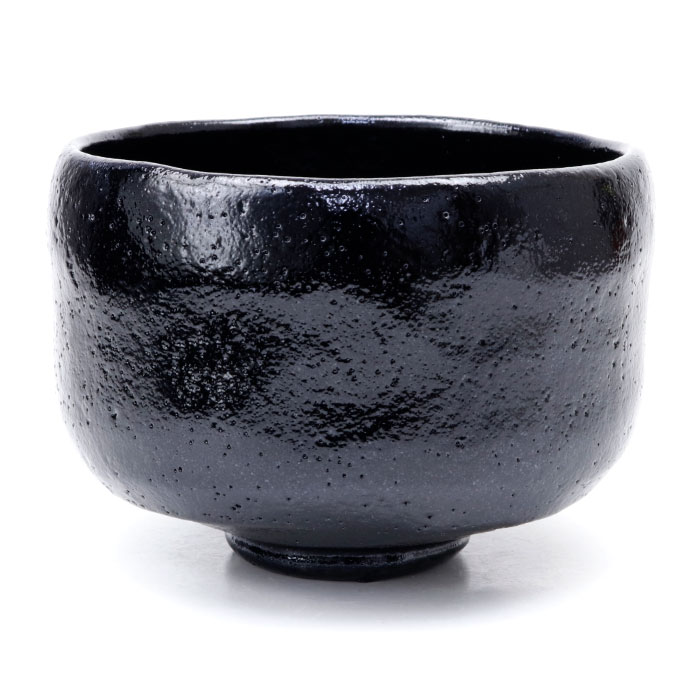

INFO: Sending out request, model: gemini-2.5-flash, backend: GoogleLLMVariant.VERTEX_AI, stream: False
INFO: AFC is enabled with max remote calls: 10.
/Users/rtsuji/Dev/tea-analyze/tea-agent/.venv/lib/python3.13/site-packages/google/auth/_default.py:76: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)
INFO: HTTP Request: POST https://us-central1-aiplatform.googleapis.com/v1beta1/projects/ntv-contech-poc/locations/us-central1/publishers/google/models/gemini-2.5-flash:generateContent "HTTP/1.1 200 OK"
INFO: Response received from the model.
INFO: Sending out request, model: gemini-2.5-flash, backend: GoogleLLMVariant.VERTEX_AI, stream: False
INFO: AFC is enabled with max remote calls: 

====
content=Content(
  parts=[
    Part(
      function_call=FunctionCall(
        args={
          'agent_name': 'tool_identify_agent'
        },
        id='adk-4875deeb-5c7b-442a-b421-93614a8c275a',
        name='transfer_to_agent'
      ),
      thought_signature=b'\n\xa7\x05\x01\xcb\xbd\xf0\xf0\x0f\x9c\xad\xf74\xf3u\xe7\xf6\x87\x1d%R-\x1d\x08KHP\x94uF[\x8e\xe0\x98e\xa2\xbb3l\xf9\x99\xce#\x16\x15\x96\x84\xac\x11\xbcn\xd5x\x88\xc6\x9e\xec\xc0\x07 B\xab\x16\xd9\x0fC\xbbK\xd7\xab\x91\x0cw\xa1~\x19V\xb2\x19:\xca\xfe\xbf\xa5\xba\x8d\xcd3\xec\xbb\xce\xb0NH\xd0\xc9[...'
    ),
  ],
  role='model'
) grounding_metadata=None partial=None turn_complete=None error_code=None error_message=None interrupted=None custom_metadata=None usage_metadata=GenerateContentResponseUsageMetadata(
  candidates_token_count=13,
  candidates_tokens_details=[
    ModalityTokenCount(
      modality=<MediaModality.TEXT: 'TEXT'>,
      token_count=13
    ),
  ],
  prompt_token_count=1573,
  prompt_tokens_details=[


INFO: HTTP Request: POST https://us-central1-aiplatform.googleapis.com/v1beta1/projects/ntv-contech-poc/locations/us-central1/publishers/google/models/gemini-2.5-flash:generateContent "HTTP/1.1 200 OK"
INFO: Response received from the model.


====
content=Content(
  parts=[
    Part(
      text="""かしこまりました。画像に写っている茶碗について、茶道の専門家として詳しく解説させていただきます。

---

### 茶碗の解説

画像に写っているのは、典型的な**黒楽茶碗（くろらくぢゃわん）**です。

1.  **道具の名称と種類**
    *   **名称:** 黒楽茶碗（くろらくぢゃわん）
    *   **種類:** 楽焼（らくやき）の一種です。楽焼は、長次郎（ちょうじろう）によって始められた、手捏ね（てづくね）で成形し、低温で焼成される陶器の一種で、茶道の世界で非常に重んじられています。特に黒楽は、その深い色合いと手になじむ温かみのある感触が特徴です。

2.  **材質や技法の特徴**
    *   **材質:** 楽焼は、粘土の性質を活かし、土の温かみを感じさせる素朴な質感が特徴です。
    *   **技法:**
        *   **手捏ね（てづくね）:** ロクロを使わず、手で形を整えて作られます。そのため、ひとつとして同じ形はなく、作者の個性や手の温もりが感じられます。画像からも、わずかな歪みや手の跡のようなものが感じられ、手捏ねによるものと推測されます。
        *   **黒釉（くろぐすり）:** 黒楽茶碗は、鉄分の多い釉薬（ゆうやく）を掛けて焼き、窯から出す際に急冷することで、漆黒に近い深い黒色を発色させます。画像からも、深みのある黒色と、表面に見られる細かな凹凸や泡のような「石はぜ（いしはぜ）」、「石見（いしみ）」と呼ばれる独特の肌合いが見受けられます。これは、釉薬が溶けて固まる過程で生じるもので、楽焼特有の景色（けしき：陶器の表面の表情）となります。
        *   **高台（こうだい）:** 画像からは見えにくいですが、一般的に楽茶碗の高台は削り出しではなく、手で成形されたものが多く、力強い印象を与えます。

3.  **季節性や文様の意味**
    *   **季節性:** 黒楽茶碗は、一般的に**冬の茶碗**とされています。その理由は、黒い色が熱を吸収しやすく、また分厚い作りが熱を逃がしにくいため、温かいお抹茶が冷めにくいからです。また、寒い季節に温かみを感じさせる色合いでもあります

In [51]:
from PIL import Image
import io
from IPython.display import display

# 1. 画像のパスを指定
image_path = "img/kuroraku.jpg"


# 2. 画像を読み込む
image = Image.open(image_path)

print(f"✅ 画像を読み込みました:  {image_path}")
# 確認のために画像をノートブックに表示
display(image)

# 3. エージェントを実行
DEBUG = True

# クライアントを作成
client = await LocalApp.create(planner_agent, 'planner_agent_agent App', 'user00')

# 画像と一緒に渡すテキストプロンプト
query = '''
この画像に写っている茶碗について、道具を解説してください
'''

# 画像とテキストをエージェントに渡して実行
proposal1 = await client.stream(query, image=image)

✅ 画像を読み込みました:  img/IMG_3636.jpg


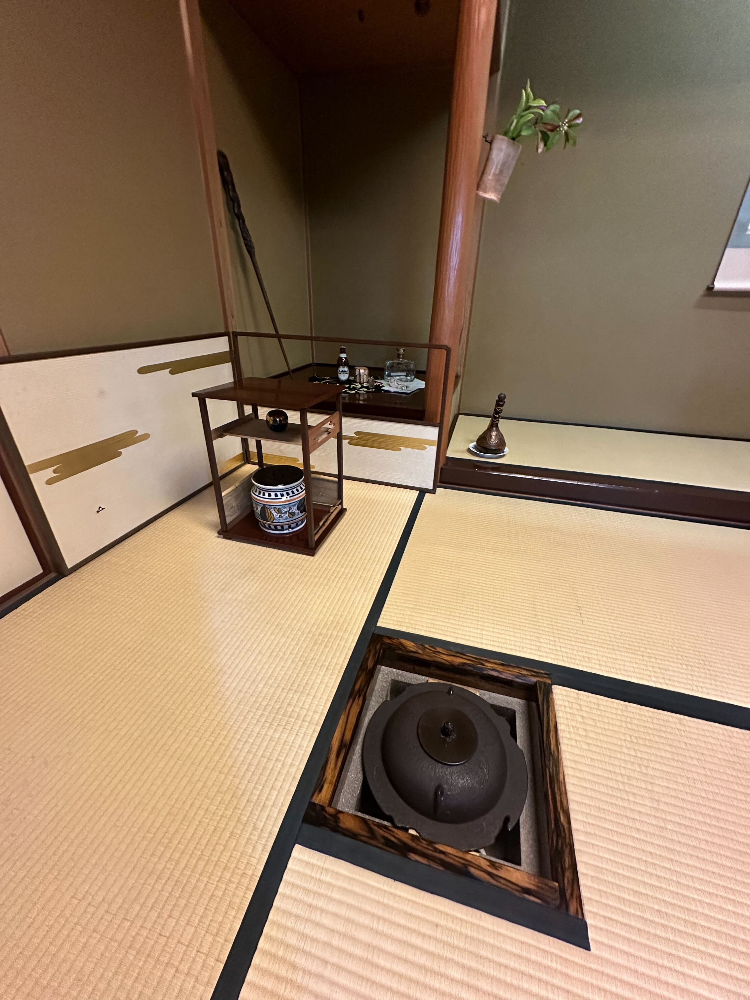

INFO: Sending out request, model: gemini-2.5-flash, backend: GoogleLLMVariant.VERTEX_AI, stream: False
INFO: AFC is enabled with max remote calls: 10.
/Users/rtsuji/Dev/tea-analyze/tea-agent/.venv/lib/python3.13/site-packages/google/auth/_default.py:76: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)
INFO: HTTP Request: POST https://us-central1-aiplatform.googleapis.com/v1beta1/projects/ntv-contech-poc/locations/us-central1/publishers/google/models/gemini-2.5-flash:generateContent "HTTP/1.1 200 OK"
INFO: Response received from the model.


====
content=Content(
  parts=[
    Part(
      text="""お茶室ですね。この写真から、お茶室の特徴について解説できます。

このお茶室は、畳が敷き詰められ、落ち着いた雰囲気があります。中央には炉（ろ）が切られており、お茶を点てるための釜が置かれていますね。これは「炉切り」と呼ばれる形式で、主に冬の時期に使われます。炉の周りの木枠は、美しい木目が特徴的です。

また、床の間（とこのま）のようなスペースには、置物が飾られています。隣には棚があり、様々な道具が置かれているようです。壁にはシンプルな意匠の襖（ふすま）が見え、全体的に日本の伝統的な美意識が感じられます。

お茶室は、季節や目的に応じて様々な設えがされますが、このお茶室は、お点前（おてまえ）を行うための機能と、お客様をもてなすための空間美が両立しているようです。""",
      thought_signature=b"\n\xfe\x05\x01\xcb\xbd\xf0\xf0\x8c\n%\xff\xee\xf3^\xc4\xcf\\\x1f\xb7k\xa3\xec,\xab\x95\xd0\xdf\xb8\xd7\x00\x1c\xed'\xe58\xdc\x05[7\xfe\xea\x1e\xf7\xd40`\x92\xe3\xf5'4\x8b\xe1\xc9Y\x90\xecE0\xd6\xcd}k\x9fs\xb1\xf4\xc8T0\xee\xef{\x00\xae\x1c+lcA\x1b\xccz\xf2\xbb\xad\x0b\xce\xfb\xf9\xd8\xf6'\\C\x7f...'
    ),
  ],
  role='model'
) grounding_metadata=None partial=None turn_complete=None error_code=None error_message=None interrupted=None custom_metadata=None usage_metadata=GenerateContentResponseUsageMetadata(
  candidates_token_count=189,
  candidates_tokens_details=[
    Mod

In [52]:
# 1. 画像のパスを指定
image_path = "img/IMG_3636.jpg"


# 2. 画像を読み込む
image = Image.open(image_path)

print(f"✅ 画像を読み込みました:  {image_path}")
# 確認のために画像をノートブックに表示
display(image)

# 3. エージェントを実行
DEBUG = True

# クライアントを作成
client = await LocalApp.create(planner_agent, 'planner_agent_agent App', 'user00')

# 画像と一緒に渡すテキストプロンプト
query = '''
お茶室です
'''

# 画像とテキストをエージェントに渡して実行
proposal1 = await client.stream(query, image=image)